<a href="https://colab.research.google.com/github/FerreiraVini/Taxi_trajectory_prediction_Lisbon/blob/main/Taxi_trajectory_prediction_2_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Taxi trajectory project**

**Vinícius Guimarães Ferreira**

**02/11/2023**

**Goal:** To predict the final destination of taxi rides in Porto, Portugal, to allow the companies better distribute new rides.

*Available data:*

1) TRIP_ID: (String) It contains an unique identifier for each trip;

2) CALL_TYPE: (char) It identifies the way used to demand this service. It may contain one of three possible values:
‘A’ if this trip was dispatched from the central;
‘B’ if this trip was demanded directly to a taxi driver on a specific stand;
‘C’ otherwise (i.e. a trip demanded on a random street).

3) ORIGIN_CALL: (integer) It contains an unique identifier for each phone number which was used to demand, at least, one service. It identifies the trip’s customer if CALL_TYPE=’A’. Otherwise, it assumes a NULL value;

4) ORIGIN_STAND: (integer): It contains an unique identifier for the taxi stand. It identifies the starting point of the trip if CALL_TYPE=’B’. Otherwise, it assumes a NULL value;

5) TAXI_ID: (integer): It contains an unique identifier for the taxi driver that performed each trip;

6) TIMESTAMP: (integer) Unix Timestamp (in seconds). It identifies the trip’s start; 

7) DAYTYPE: (char) It identifies the daytype of the trip’s start. It assumes one of three possible values:
‘B’ if this trip started on a holiday or any other special day (i.e. extending holidays, floating holidays, etc.);
‘C’ if the trip started on a day before a type-B day;
‘A’ otherwise (i.e. a normal day, workday or weekend).

8) MISSING_DATA: (Boolean) It is FALSE when the GPS data stream is complete and TRUE whenever one (or more) locations are missing

9) POLYLINE: (String): It contains a list of GPS coordinates (i.e. WGS84 format) mapped as a string. The beginning and the end of the string are identified with brackets
 (i.e. [ and ], respectively). Each pair of coordinates is also identified by the same brackets as [LONGITUDE, LATITUDE]. This list contains one pair of coordinates for each 15 seconds of trip.
 The last list item corresponds to the trip’s destination while the first one represents its start;

# Import Libraries and data

In [1]:
#for data import
import zipfile
from google.colab import drive
from google.colab import files

#for df handling and graph plots
import pandas as pd
import numpy as np
!pip install tqdm
from tqdm import tqdm
import seaborn as sns
import re
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import time
import math
import geopy.distance
from pyparsing.helpers import empty
from pylab import rcParams
import plotly.express as px
import plotly.subplots as sp

#for statistical models
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency
from sklearn.dummy import DummyClassifier
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import lightgbm as ltb
from xgboost import XGBClassifier
import statistics
!pip install catboost
from catboost import CatBoostClassifier
from sklearn.preprocessing import LabelEncoder

#for model evaluation
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.inspection import permutation_importance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Data import

In [2]:
drive.mount('/content/gdrive')

df = pd.read_csv('/content/gdrive/MyDrive/Data analysis - study/Taxi Trajectory Prediction Competition/train.csv')

zipfile = zipfile.ZipFile('/content/gdrive/MyDrive/Data analysis - study/Taxi Trajectory Prediction Competition/metaData_taxistandsID_name_GPSlocation.csv.zip')
location = pd.read_csv(zipfile.open('metaData_taxistandsID_name_GPSlocation.csv'))

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Reading in chunks and getting a small sample

In [3]:
#calculating the number of chunks on my df, with chunksize of 100000

num_rows = len(df)
chunksize = 100000
num_chunks = math.ceil(num_rows/chunksize)
print('Number of chunks = ', num_chunks)

Number of chunks =  18


In [4]:
df_iterator = pd.read_csv('/content/gdrive/MyDrive/Data analysis - study/Taxi Trajectory Prediction Competition/train.csv', chunksize = chunksize)
counter = 0  # contador
fraction = (1/17)
for chunk in tqdm(df_iterator, total=(num_chunks-1)):
    if counter == 0:
        df1 = chunk.sample(frac=fraction, random_state = 44) #getting aprox 6k rows of each chunk, using random_state to make reproductible
    else:
        df_aux = chunk.sample(frac=fraction, random_state = 44)
        df1 = pd.concat([df1,df_aux], axis=0)
    if df1.shape[0] >= 100000:
        break
    counter += 1
df1 = df1.reset_index(drop=True)

100%|██████████| 17/17 [00:51<00:00,  3.02s/it]


In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100622 entries, 0 to 100621
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   TRIP_ID       100622 non-null  int64  
 1   CALL_TYPE     100622 non-null  object 
 2   ORIGIN_CALL   21226 non-null   float64
 3   ORIGIN_STAND  47694 non-null   float64
 4   TAXI_ID       100622 non-null  int64  
 5   TIMESTAMP     100622 non-null  int64  
 6   DAY_TYPE      100622 non-null  object 
 7   MISSING_DATA  100622 non-null  bool   
 8   POLYLINE      100622 non-null  object 
dtypes: bool(1), float64(2), int64(3), object(3)
memory usage: 6.2+ MB


the number of samples in the final chunk was a little higher than 100,000, but that is ok, I have a sample of each full chunk in my test df now.

# Understanding the data

In [6]:
df1.head()

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,1373339722620000403,B,NaN,18.0,20000403,1373339722,A,False,"[[-8.619813,41.148063],[-8.619831,41.148063],[..."
1,1372660608620000235,B,NaN,28.0,20000235,1372660608,A,False,"[[-8.584218,41.163201],[-8.584434,41.163138],[..."
2,1374414958620000271,C,NaN,NaN,20000271,1374414958,A,False,"[[-8.636454,41.164317],[-8.636283,41.164227],[..."
3,1373338740620000671,C,NaN,NaN,20000671,1373338740,A,False,"[[-8.612757,41.140449],[-8.612865,41.140431],[..."
4,1373070030620000688,A,35289.0,NaN,20000688,1373070030,A,False,"[[-8.569782,41.166072],[-8.569665,41.166144],[..."


In [7]:
df1.describe(include='all')

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
count,1.006220e+05,100622,21226.000000,47694.000000,1.006220e+05,1.006220e+05,100622,100622,100622
unique,NaN,3,NaN,NaN,NaN,NaN,1,1,100251
top,NaN,B,NaN,NaN,NaN,NaN,A,False,[]
freq,NaN,48384,NaN,NaN,NaN,NaN,100622,100622,366
mean,1.388624e+18,NaN,24666.223782,30.217868,2.000035e+07,1.388624e+09,NaN,NaN,NaN
std,9.180672e+15,NaN,19599.958566,17.784400,2.116732e+02,9.180672e+06,NaN,NaN,NaN
min,1.372640e+18,NaN,2001.000000,1.000000,2.000000e+07,1.372640e+09,NaN,NaN,NaN
25%,1.380733e+18,NaN,6654.000000,15.000000,2.000017e+07,1.380733e+09,NaN,NaN,NaN
50%,1.388497e+18,NaN,19147.000000,27.000000,2.000034e+07,1.388497e+09,NaN,NaN,NaN
75%,1.396750e+18,NaN,40914.750000,49.000000,2.000052e+07,1.396750e+09,NaN,NaN,NaN


Note that DAY_TYPE is always A. I checked in the entire df, and it is always A... meaning that is never a holliday or day before a holliday (Strange) So we can drop this column.

In [8]:
#Exclude samples with missing_data = true

print('Missing data initial count: ', df1['MISSING_DATA'].value_counts(), '\n')
df1 = df1.loc[df1['MISSING_DATA'] == False]
print('Missing data after exclusion: ', df1['MISSING_DATA'].value_counts())

Missing data initial count:  False    100622
Name: MISSING_DATA, dtype: int64 

Missing data after exclusion:  False    100622
Name: MISSING_DATA, dtype: int64


In [9]:
df1.count()

TRIP_ID         100622
CALL_TYPE       100622
ORIGIN_CALL      21226
ORIGIN_STAND     47694
TAXI_ID         100622
TIMESTAMP       100622
DAY_TYPE        100622
MISSING_DATA    100622
POLYLINE        100622
dtype: int64

Besides Origin call and origin stand, we have the same number of values... meaning I have no NAN in the columns. The two mentioned columns are expected to have different count, since not all the samples have this feature.

In [10]:
duplicate_rows_df1 = df1[df1.duplicated()]
print("number of duplicated rows in df1: ", duplicate_rows_df1.shape)

number of duplicated rows in df1:  (0, 9)


So no duplicated rows in my sample df.

In [11]:
#check the number of TRIP_ID duplicated
print('TRIP_ID duplicates:', df1.duplicated('TRIP_ID').sum())


TRIP_ID duplicates: 0


So all the TRIP_IDs are unique.

In [12]:
#Check the number of TAXI_IDs duplicated, i.e. number of taxi drivers with multiple rides
print('TAXI_IDs with multiple rides: ', df1.duplicated('TAXI_ID').sum())

#Check the number of TAXI_IDs unique, i.e. number of taxi drivers with one single ride
print('TAXI_IDs with one single ride: ', (~df1.duplicated('TAXI_ID')).sum())

TAXI_IDs with multiple rides:  100180
TAXI_IDs with one single ride:  442


As we have many TAXI_IDs with multiple runs, lets check how many rides each ID did.

In [13]:
experience = df1.TAXI_ID.value_counts().to_frame().reset_index()
experience.rename(columns = {'TAXI_ID':'RUNS'}, inplace = True)
experience.rename(columns = {'index':'TAXI_ID'}, inplace = True)
print('Experience Head: ', '\n',
      experience.head(), '\n')

print('Experience Description: ', '\n',
experience.describe())

Experience Head:  
     TAXI_ID  RUNS
0  20000080   603
1  20000403   531
2  20000483   521
3  20000089   467
4  20000066   450 

Experience Description:  
             TAXI_ID        RUNS
count  4.420000e+02  442.000000
mean   2.000035e+07  227.651584
std    2.188405e+02   94.385641
min    2.000000e+07    1.000000
25%    2.000016e+07  162.250000
50%    2.000034e+07  221.500000
75%    2.000052e+07  293.500000
max    2.000098e+07  603.000000


The maximum runs per taxi_ID was 603, while the average was 227 runs, with 50% of the IDs with less than 221 runs.

# Exploratory Data Analysis (EDA)

## Dropon and dropoff EDA

In [14]:
#Lets get the drop on and drop off latitude and longitude from POLYLINE (dropon = 1st lat and 1st lon; dropoff = last lat and last lon)
# 1st lon
lists_1st_lon = []
for i in tqdm(range(0,len(df1["POLYLINE"]))):
    if df1["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lon.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", df1["POLYLINE"][i]).split(",")[0]
        lists_1st_lon.append(k)
        
df1["lon_1st"] = lists_1st_lon

# 1st lat
lists_1st_lat = []
for i in tqdm(range(0,len(df1["POLYLINE"]))):
    if df1["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", df1["POLYLINE"][i]).split(",")[1]
        lists_1st_lat.append(k)
        
df1["lat_1st"] = lists_1st_lat

# last long
lists_last_lon = []
for i in tqdm(range(0,len(df1["POLYLINE"]))):
        if df1["POLYLINE"][i] == '[]':
            k=0
            lists_last_lon.append(k)
        else:
            k = re.sub(r"[[|[|]|]|]]", "", df1["POLYLINE"][i]).split(",")[-2]
            lists_last_lon.append(k)

df1["lon_last"] = lists_last_lon

# last lat
lists_last_lat = []
for i in tqdm(range(0,len(df1["POLYLINE"]))):
    if df1["POLYLINE"][i] == '[]':
        k=0
        lists_last_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", df1["POLYLINE"][i]).split(",")[-1]
        lists_last_lat.append(k)
        
df1["lat_last"] = lists_last_lat

df1["lon_1st"] = df1["lon_1st"].apply(lambda lon_1st:pd.to_numeric(lon_1st, errors='coerce'))
df1["lat_1st"] = df1["lat_1st"].apply(lambda lat_1st:pd.to_numeric(lat_1st, errors='coerce'))
df1["lon_last"] = df1["lon_last"].apply(lambda lon_last:pd.to_numeric(lon_last, errors='coerce'))
df1["lat_last"] = df1["lat_last"].apply(lambda lat_last:pd.to_numeric(lat_last, errors='coerce'))

print('DF HEAD: ', '\n', df1.head(), '\n')
print('Descriptions', '\n', df1.describe(percentiles= [0.01, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]))


  0%|          | 0/100622 [00:00<?, ?it/s]<ipython-input-14-b09a48998619>:9: FutureWarning: Possible nested set at position 1
  k = re.sub(r"[[|[|]|]|]]", "", df1["POLYLINE"][i]).split(",")[0]
100%|██████████| 100622/100622 [00:09<00:00, 10415.81it/s]


DF HEAD:  
                TRIP_ID CALL_TYPE  ORIGIN_CALL  ORIGIN_STAND   TAXI_ID  \
0  1373339722620000403         B          NaN          18.0  20000403   
1  1372660608620000235         B          NaN          28.0  20000235   
2  1374414958620000271         C          NaN           NaN  20000271   
3  1373338740620000671         C          NaN           NaN  20000671   
4  1373070030620000688         A      35289.0           NaN  20000688   

    TIMESTAMP DAY_TYPE  MISSING_DATA  \
0  1373339722        A         False   
1  1372660608        A         False   
2  1374414958        A         False   
3  1373338740        A         False   
4  1373070030        A         False   

                                            POLYLINE   lon_1st    lat_1st  \
0  [[-8.619813,41.148063],[-8.619831,41.148063],[... -8.619813  41.148063   
1  [[-8.584218,41.163201],[-8.584434,41.163138],[... -8.584218  41.163201   
2  [[-8.636454,41.164317],[-8.636283,41.164227],[... -8.636454  41.164317   


Seems like we have points in 0, 0
I will exclude extreme points by selecting only lon and lat between the percentile 99% and 1% described above, and plot a scatterplot to see the distribution.

lat min =  41.11173774
lat max =  41.23746
lon min =  -8.688834
lon max =  -8.53671987


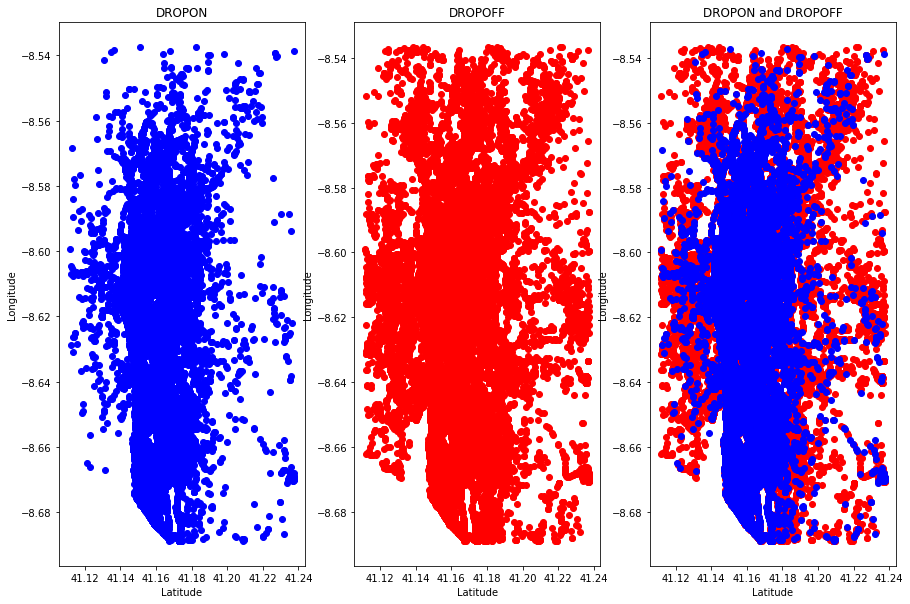

In [15]:
#excluding extreme values
latitude = pd.concat([df1['lat_1st'], df1['lat_last']])
longitude = pd.concat([df1['lon_1st'], df1['lon_last']])
lat_min = np.percentile(latitude, 1)
print('lat min = ', lat_min)
lat_max = np.percentile(latitude, 99)
print('lat max = ', lat_max)
lon_min = np.percentile(longitude, 1)
print('lon min = ', lon_min)
lon_max = np.percentile(longitude, 99)
print('lon max = ', lon_max)

df1= df1.drop(df1[(df1['lon_1st'] < lon_min)].index) 
df1= df1.drop(df1[(df1['lon_1st'] > lon_max)].index)
df1= df1.drop(df1[(df1['lat_1st'] < lat_min)].index)  
df1= df1.drop(df1[(df1['lat_1st'] > lat_max)].index) 
df1= df1.drop(df1[(df1['lon_last'] < lon_min)].index) 
df1= df1.drop(df1[(df1['lon_last'] > lon_max)].index) 
df1= df1.drop(df1[(df1['lat_last'] < lat_min)].index) 
df1= df1.drop(df1[(df1['lat_last'] > lat_max)].index)
df1.reset_index()

#lets see the dropon and dropoff distribution
fig, (dropon, dropoff, droponoff) = plt.subplots(1, 3, figsize=(15, 10))
dropoff.scatter(df1['lat_last'], df1['lon_last'], c='r')
dropoff.set_title('DROPOFF')
dropoff.set_xlabel('Latitude')
dropoff.set_ylabel('Longitude')

dropon.scatter(df1['lat_1st'], df1['lon_1st'], c='b')
dropon.set_title('DROPON')
dropon.set_xlabel('Latitude')
dropon.set_ylabel('Longitude')

droponoff.scatter(df1['lat_last'], df1['lon_last'], c = 'r')
droponoff.scatter(df1['lat_1st'], df1['lon_1st'], c = 'b')
droponoff.set_title('DROPON and DROPOFF')
droponoff.set_xlabel('Latitude')
droponoff.set_ylabel('Longitude')

plt.show()
print('\n')

#now lets check on a real map
fig = px.scatter_mapbox(df1, lat='lat_1st', lon='lon_1st', zoom=11,height=600,width=600, opacity=0.5, color_discrete_sequence=['blue'], title='DROPON and DROPOFF in a real Lisbon map')
fig.add_trace(px.scatter_mapbox(df1, lat='lat_last', lon='lon_last', zoom=11,height=600,width=600, opacity=0.5, color_discrete_sequence=['red']).data[0])
fig.update_layout(mapbox_style='open-street-map')
fig.show()

Now the rides are all near Lisbon area, and we are considering only high density places.

In [16]:
#Calculate if the ride is inbound or outbound (I could use actual coordinates, but this is a simple way, adjustable for any data)

#calculate the mean point for the drop on and drop off
mean_lat = latitude.mean()
mean_lon = longitude.mean()
print('mean point = ', mean_lat, mean_lon, '\n')
df1['Ride_direction'] = empty

#now calculate in km the distance from the center for dropon and dropoff (I used euclidian distance here, as it is only for direction accessment) 
for index, row in tqdm(df1.iterrows()):
  Dropon_distance = np.sqrt((row['lat_1st'] - mean_lat)**2 + (row['lon_1st'] - mean_lon)**2) * 111 # 1 degree is about 111km. As the coordinates are from a city, I will not consider the earth curvature
  Dropoff_distance = np.sqrt((row['lat_last'] - mean_lat)**2 + (row['lon_last'] - mean_lon)**2) * 111
  difference = Dropon_distance - Dropoff_distance
  if difference > 0:
    Ride_direction = 'inbound'
  else:
    Ride_direction = 'outbound'
  df1.loc[index, 'Ride_direction'] = Ride_direction
print(df1['Ride_direction'], '\n')
print(df1['Ride_direction'].value_counts())

mean point =  41.0100038077657 -8.587240348020314 



94383it [02:55, 536.93it/s]

0         outbound
1          inbound
2          inbound
3         outbound
4         outbound
            ...   
100617    outbound
100618     inbound
100619     inbound
100620     inbound
100621    outbound
Name: Ride_direction, Length: 94383, dtype: object 

outbound    54934
inbound     39449
Name: Ride_direction, dtype: int64


In [17]:
#looking the data I saw that ']' appears in the end of each coordinate, and in the end of the string. I can calculate how many coordinates I have in each row by counting the number of times
#that ']' appears, minus 1 (the one in the end of the string). I also know that from one coordinate to the other we have 15 seconds.
df1['Ride_time'] = (((df1['POLYLINE'].str.count(']'))-2)*15)/60 #the minus 2 is due to the final ']' and 1 from the first coordenate, that doesnot count as 15 seconds, as it is the first coordenate

print('Descriptions', '\n', df1['Ride_time'].describe(percentiles= [0.01, 0.02, 0.05, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]))


Descriptions 
 count    94383.000000
mean        11.467632
std         10.747268
min          0.000000
1%           0.000000
2%           0.250000
5%           3.000000
25%          6.500000
50%          9.750000
75%         14.000000
90%         19.000000
95%         24.000000
99%         43.500000
max        958.750000
Name: Ride_time, dtype: float64


we have rides with extreme times (almost 1000 minutes). I will exclude the rides with ride time higher than 99% percentile and lower than 5%

In [18]:
time_max = np.percentile(df1['Ride_time'], 99)
print('time_max = ', time_max)
time_min = np.percentile(df1['Ride_time'], 5)
print('time_min = ', time_min)

df1= df1[df1['Ride_time'] <= time_max]
df1= df1[df1['Ride_time'] >= time_min]
df1.reset_index()

print('New Descriptions', '\n', df1['Ride_time'].describe(percentiles= [0.01, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]))
print('DF1 overview : ', '\n', df1.describe())

time_max =  43.5
time_min =  3.0
New Descriptions 
 count    88847.000000
mean        11.317779
std          6.071477
min          3.000000
1%           3.250000
25%          7.000000
50%         10.000000
75%         14.000000
90%         18.750000
95%         23.000000
99%         33.500000
max         43.500000
Name: Ride_time, dtype: float64
DF1 overview :  
             TRIP_ID   ORIGIN_CALL  ORIGIN_STAND       TAXI_ID     TIMESTAMP  \
count  8.884700e+04  19616.000000  43652.000000  8.884700e+04  8.884700e+04   
mean   1.388632e+18  24819.154364     30.228672  2.000035e+07  1.388632e+09   
std    9.177638e+15  19547.167190     17.772557  2.109298e+02  9.177638e+06   
min    1.372640e+18   2001.000000      1.000000  2.000000e+07  1.372640e+09   
25%    1.380744e+18   6731.000000     15.000000  2.000017e+07  1.380744e+09   
50%    1.388504e+18  19333.500000     27.000000  2.000034e+07  1.388504e+09   
75%    1.396750e+18  40946.250000     49.000000  2.000052e+07  1.396750e+09   
ma

Now lets separate the rides accordingly to Dropon distance from the center.

In [19]:
#could join this cell with the inbound/outbound calculation for a faster code.

df1['Dropon_distance'] = np.sqrt((df1['lat_1st'] - mean_lat)**2 + (df1['lon_1st'] - mean_lon)**2) * 111
percentile_25 = np.percentile(df1['Dropon_distance'], 25)
percentile_50 = np.percentile(df1['Dropon_distance'], 50)
percentile_75 = np.percentile(df1['Dropon_distance'], 75)

for index, row in tqdm(df1.iterrows()):
  if row['Dropon_distance'] < percentile_25:
    dropon_dist = 'A'
  elif row['Dropon_distance'] < percentile_50:
    dropon_dist = 'B'
  elif row['Dropon_distance'] < percentile_75:
    dropon_dist = 'C'
  else:
    dropon_dist = 'D'
  
  df1.loc[index, 'dropon_dist'] = dropon_dist
print(df1['dropon_dist'], '\n')
print('percentile_A = rides with distance from center < ',percentile_25,'\n')
print('percentile_B = rides with distance from center > ',percentile_25, 'and < ',percentile_50,'\n')
print('percentile_C = rides with distance from center > ',percentile_50, 'and < ',percentile_75,'\n')
print('percentile_D = rides with distance from center > ',percentile_75,'\n')
df1 = df1.drop(['Dropon_distance'], axis='columns')
print('Value counts for dropon_dist :', df1['dropon_dist'].value_counts())

88847it [02:25, 610.01it/s]

0         B
1         C
2         D
3         A
4         C
         ..
100617    B
100618    D
100619    B
100620    C
100621    B
Name: dropon_dist, Length: 88847, dtype: object 

percentile_A = rides with distance from center <  15.458564914114405 

percentile_B = rides with distance from center >  15.458564914114405 and <  16.745702219451932 

percentile_C = rides with distance from center >  16.745702219451932 and <  17.849647301083344 

percentile_D = rides with distance from center >  17.849647301083344 

Value counts for dropon_dist : C    22212
D    22212
A    22212
B    22211
Name: dropon_dist, dtype: int64


Now we should calculate the distance from dropon to dropoff. As it is a distance in a city, meaning in streets, manhattan distance is more accurate for the ride distance.

In [20]:
df1['Manhattan_distance'] = (abs(df1['lat_1st'] - df1['lat_last']) + abs(df1['lon_1st'] - df1['lon_last']))*111
df1.head()

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,lon_1st,lat_1st,lon_last,lat_last,Ride_direction,Ride_time,dropon_dist,Manhattan_distance
0,1373339722620000403,B,NaN,18.0,20000403,1373339722,A,False,"[[-8.619813,41.148063],[-8.619831,41.148063],[...",-8.619813,41.148063,-8.637750,41.150304,outbound,4.00,B,2.239758
1,1372660608620000235,B,NaN,28.0,20000235,1372660608,A,False,"[[-8.584218,41.163201],[-8.584434,41.163138],[...",-8.584218,41.163201,-8.556471,41.145363,inbound,8.25,C,5.059935
2,1374414958620000271,C,NaN,NaN,20000271,1374414958,A,False,"[[-8.636454,41.164317],[-8.636283,41.164227],[...",-8.636454,41.164317,-8.630802,41.154471,inbound,4.25,D,1.720278
3,1373338740620000671,C,NaN,NaN,20000671,1373338740,A,False,"[[-8.612757,41.140449],[-8.612865,41.140431],[...",-8.612757,41.140449,-8.577999,41.145417,outbound,9.25,A,4.409586
4,1373070030620000688,A,35289.0,NaN,20000688,1373070030,A,False,"[[-8.569782,41.166072],[-8.569665,41.166144],[...",-8.569782,41.166072,-8.682345,41.177124,outbound,14.75,C,13.721265


It is expected to see a correlation between manhattan distance and ride time. Lets check.

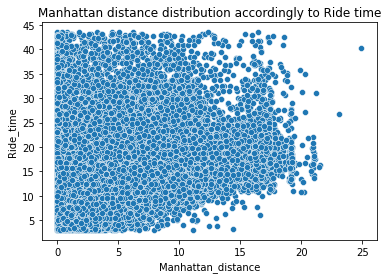

In [21]:
sns.scatterplot(x='Manhattan_distance', y='Ride_time', data=df1)
sns.set(rc={'figure.figsize':(7,5)})
plt.title('Manhattan distance distribution accordingly to Ride time')
plt.show()

Not perfectly correlated. we have several rides with high time and low distance... probably due to traffic. Lets look, as an exercise, how would be a density plot to see the traffic density (assuming that high traffic is where we have long rides with low distance).

In [22]:
traffic = df1.query('Manhattan_distance <= 10 & Ride_time >= 10')
fig = px.density_mapbox(traffic, lat='lat_1st', lon='lon_1st', z='Ride_time', radius=2, zoom=11,height=600,width=1200, mapbox_style='stamen-terrain', title='Density plot for dropon by Ride time')
fig.show()

fig2 = px.density_mapbox(traffic, lat='lat_last', lon='lon_last', z='Ride_time', radius=2, zoom=11,height=600,width=1200, mapbox_style='stamen-terrain', title='Density plot for dropoff by Ride time')
fig2.show()


## Drivers experience EDA

Text(0.5, 1.0, 'Number of Drivers accordingly to experience')

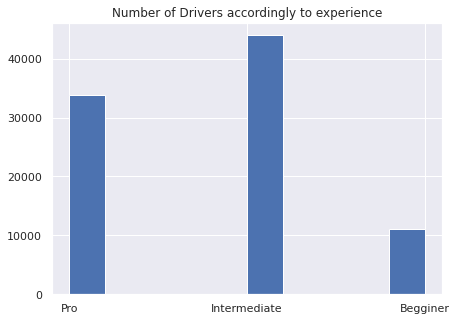

In [23]:
#Now lets check if experience has any tendency for dropon and dropoff
col         = 'RUNS'
conditions  = [ experience[col] <= 162, (experience[col] > 162) & (experience[col] < 293), experience[col] > 293 ]
choices     = [ "Begginer", 'Intermediate', 'Pro' ]
    
experience["Experience"] = np.select(conditions, choices, default=np.nan)
df1 = df1.merge(experience)
df1 = df1.drop(['RUNS'], axis = 'columns')
df1['Experience'].hist()
plt.title('Number of Drivers accordingly to experience')

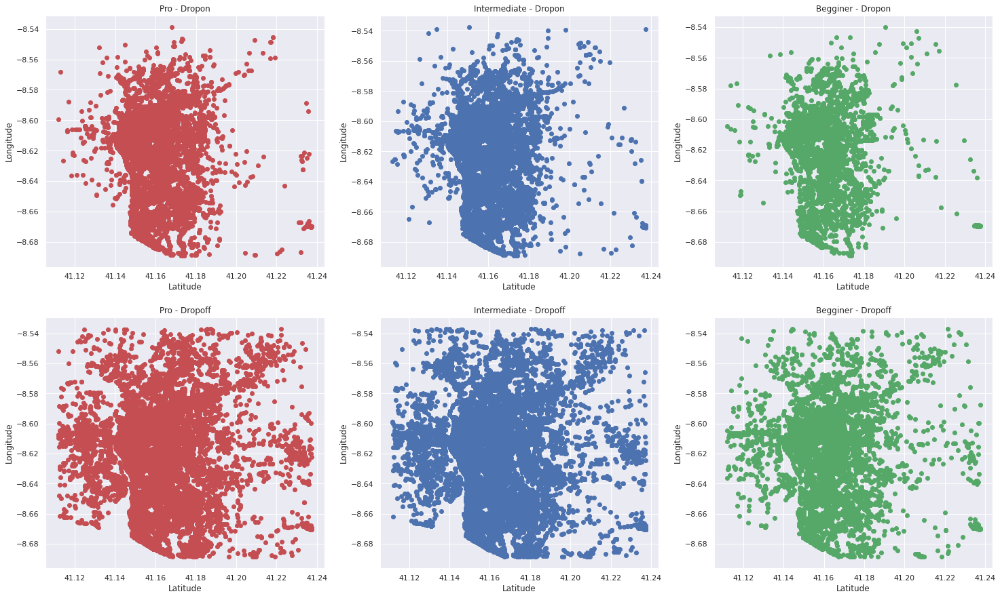

In [24]:
#lets see the dropon and dropoff distribution accordingly to driver's experience
prof = df1.drop(df1[(df1['Experience'] != 'Pro')].index)
inte = df1.drop(df1[(df1['Experience'] != 'Intermediate')].index)
begg = df1.drop(df1[(df1['Experience'] != 'Begginer')].index)

fig, ((pro, intermediate, begginer), (pro_dropoff, intermediate_dropoff, begginer_dropoff)) = plt.subplots(2, 3, figsize=(25, 15))
pro.scatter(prof['lat_1st'], prof['lon_1st'], c='r')
pro.set_title('Pro - Dropon')
pro.set_xlabel('Latitude')
pro.set_ylabel('Longitude')

intermediate.scatter(inte['lat_1st'], inte['lon_1st'], c='b')
intermediate.set_title('Intermediate - Dropon')
intermediate.set_xlabel('Latitude')
intermediate.set_ylabel('Longitude')

begginer.scatter(begg['lat_1st'], begg['lon_1st'], c = 'g')
begginer.set_title('Begginer - Dropon')
begginer.set_xlabel('Latitude')
begginer.set_ylabel('Longitude')

pro_dropoff.scatter(prof['lat_last'], prof['lon_last'], c='r')
pro_dropoff.set_title('Pro - Dropoff')
pro_dropoff.set_xlabel('Latitude')
pro_dropoff.set_ylabel('Longitude')

intermediate_dropoff.scatter(inte['lat_last'], inte['lon_last'], c='b')
intermediate_dropoff.set_title('Intermediate - Dropoff')
intermediate_dropoff.set_xlabel('Latitude')
intermediate_dropoff.set_ylabel('Longitude')

begginer_dropoff.scatter(begg['lat_last'], begg['lon_last'], c = 'g')
begginer_dropoff.set_title('Begginer - Dropoff')
begginer_dropoff.set_xlabel('Latitude')
begginer_dropoff.set_ylabel('Longitude')

plt.show()
print('\n')

#now lets check on a real map
fig = px.scatter_mapbox(df1, lat='lat_1st', lon='lon_1st', zoom=11,height=600,width=1200, opacity=0.5, color ='Experience', color_discrete_map={'Pro': 'red', 'Intermediate': 'blue', 'Begginer': 'green'}, title='DROPON by Drivers Experience')
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

fig2 = px.scatter_mapbox(df1, lat='lat_last', lon='lon_last', zoom=11,height=600,width=1200, opacity=0.5, color ='Experience', color_discrete_map={'Pro': 'red', 'Intermediate': 'blue', 'Begginer': 'green'}, title='DROPOFF by Drivers Experience')
fig2.update_layout(mapbox_style='open-street-map')
fig2.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig2.show()


Seems that we do not have much of a difference between the dropon and dropoff positions accordingly with the driver's experience.

Lets check if there is a difference in rides km between the groups.

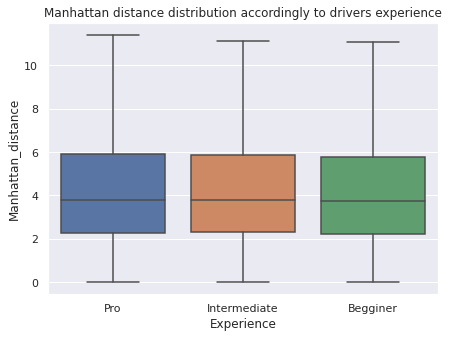

In [25]:
sns.boxplot(x='Experience', y='Manhattan_distance', data=df1, showfliers=False)
sns.set(rc={'figure.figsize':(7,5)})
plt.title('Manhattan distance distribution accordingly to drivers experience')
plt.show()

Apparently there is no significant difference between the experiences and distances, as there is no high difference in the drop on and drop off locations. Therefore, experience parameters are not significant for this analysis.

In [26]:
df1 = df1.drop(['Experience'], axis = 'columns')
df1.head()

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,lon_1st,lat_1st,lon_last,lat_last,Ride_direction,Ride_time,dropon_dist,Manhattan_distance
0,1373339722620000403,B,NaN,18.0,20000403,1373339722,A,False,"[[-8.619813,41.148063],[-8.619831,41.148063],[...",-8.619813,41.148063,-8.637750,41.150304,outbound,4.00,B,2.239758
1,1373681643620000403,B,NaN,18.0,20000403,1373681643,A,False,"[[-8.619606,41.148405],[-8.619777,41.148198],[...",-8.619606,41.148405,-8.665344,41.188284,outbound,9.25,B,9.503487
2,1373375722620000403,C,NaN,NaN,20000403,1373375722,A,False,"[[-8.620839,41.149683],[-8.621163,41.150943],[...",-8.620839,41.149683,-8.612343,41.154966,outbound,3.00,B,1.529469
3,1374302567620000403,B,NaN,10.0,20000403,1374302567,A,False,"[[-8.60706,41.150241],[-8.607132,41.150205],[-...",-8.607060,41.150241,-8.575983,41.160006,outbound,8.00,B,4.533462
4,1373719493620000403,B,NaN,63.0,20000403,1373719493,A,False,"[[-8.609616,41.160366],[-8.609724,41.160375],[...",-8.609616,41.160366,-8.632557,41.162058,outbound,5.75,C,2.734263


Verify a correlation between TAXI_ID and origin stand.

In [27]:
contingency_table = pd.crosstab(df1['TAXI_ID'], df1['ORIGIN_STAND'])

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square test statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")

Chi-square test statistic: 286318.4439904546
P-value: 0.0
Degrees of freedom: 26657


## Timestamp EDA

In [28]:
df1['TIMESTAMP'] = pd.to_datetime(df1['TIMESTAMP'], unit='s')
df1.dtypes

TRIP_ID                        int64
CALL_TYPE                     object
ORIGIN_CALL                  float64
ORIGIN_STAND                 float64
TAXI_ID                        int64
TIMESTAMP             datetime64[ns]
DAY_TYPE                      object
MISSING_DATA                    bool
POLYLINE                      object
lon_1st                      float64
lat_1st                      float64
lon_last                     float64
lat_last                     float64
Ride_direction                object
Ride_time                    float64
dropon_dist                   object
Manhattan_distance           float64
dtype: object

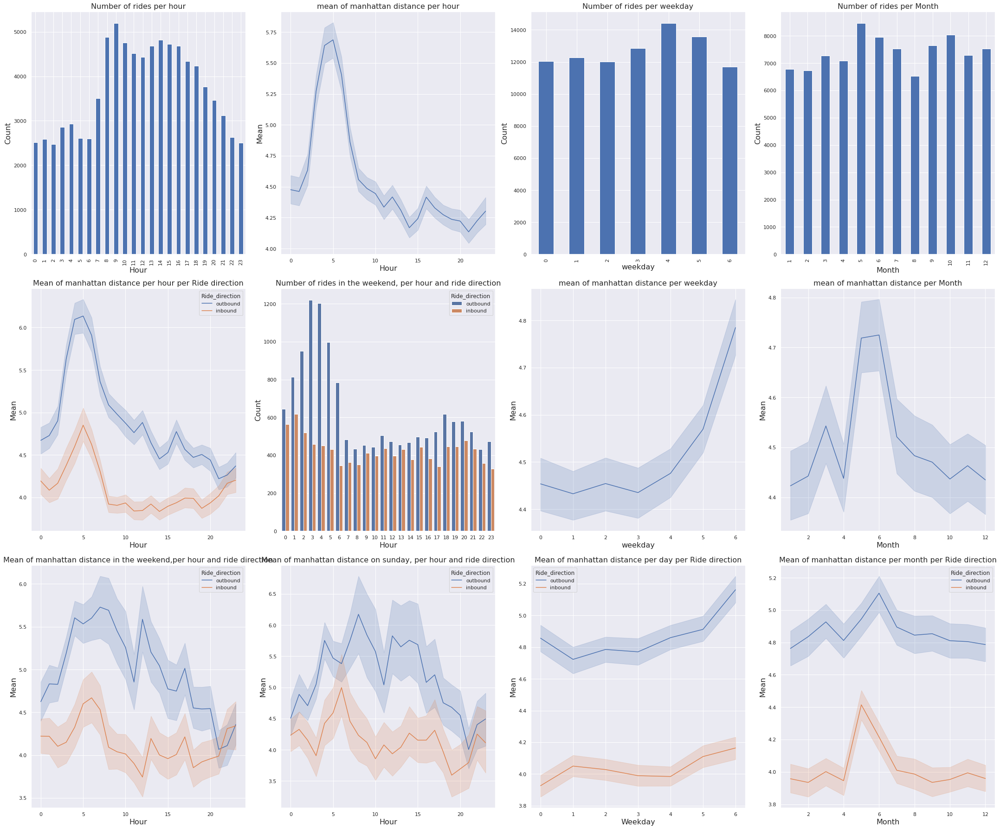

In [29]:
fig, ((ax1, ax2, ax3, ax5), (ax8, ax10, ax4, ax6), (ax11, ax12, ax7, ax9)) = plt.subplots(3, 4, figsize=(30, 25))

#lets see the number of runs per hour
df1.groupby(df1['TIMESTAMP'].dt.hour)['Manhattan_distance'].count().plot(kind='bar', ax=ax1)
ax1.set_title('Number of rides per hour', fontsize=16)
ax1.set_xlabel('Hour', fontsize=16)
ax1.set_ylabel('Count', fontsize=16)

#lets see the mean of manhattan distance per hour
sns.lineplot(x=df1['TIMESTAMP'].dt.hour, y='Manhattan_distance', data=df1, estimator=np.mean, ax=ax2)
ax2.set_title('mean of manhattan distance per hour', fontsize=16)
ax2.set_xlabel('Hour', fontsize=16)
ax2.set_ylabel('Mean', fontsize=16)

#lets see the number of runs per weekday
df1.groupby(df1['TIMESTAMP'].dt.weekday)['Manhattan_distance'].count().plot(kind='bar', ax=ax3)
ax3.set_title('Number of rides per weekday', fontsize=16)
ax3.set_xlabel('weekday', fontsize=16)
ax3.set_ylabel('Count', fontsize=16)

#lets see the mean of manhattan distance per weekday
sns.lineplot(x=df1['TIMESTAMP'].dt.weekday, y='Manhattan_distance', data=df1, estimator=np.mean, ax=ax4)
ax4.set_title('mean of manhattan distance per weekday', fontsize=16)
ax4.set_xlabel('weekday', fontsize=16)
ax4.set_ylabel('Mean', fontsize=16)

#lets see the number of runs per month
df1.groupby(df1['TIMESTAMP'].dt.month)['Manhattan_distance'].count().plot(kind='bar', ax=ax5)
ax5.set_title('Number of rides per Month', fontsize=16)
ax5.set_xlabel('Month', fontsize=16)
ax5.set_ylabel('Count', fontsize=16)

#lets see the mean of manhattan distance per month
sns.lineplot(x=df1['TIMESTAMP'].dt.month, y='Manhattan_distance', data=df1, estimator=np.mean, ax=ax6)
ax6.set_title('mean of manhattan distance per Month', fontsize=16)
ax6.set_xlabel('Month', fontsize=16)
ax6.set_ylabel('Mean', fontsize=16)

#lets see the mean of manhattan distance per weekday and ride direction
sns.lineplot(x=df1['TIMESTAMP'].dt.weekday, y='Manhattan_distance', hue='Ride_direction', data=df1, estimator=np.mean, ax=ax7)
ax7.set_title('Mean of manhattan distance per day per Ride direction', fontsize=16)
ax7.set_xlabel('Weekday', fontsize=16)
ax7.set_ylabel('Mean', fontsize=16)

#lets see the mean of manhattan distance per hour and ride direction
sns.lineplot(x=df1['TIMESTAMP'].dt.hour, y='Manhattan_distance', hue='Ride_direction', data=df1, estimator=np.mean, ax=ax8)
ax8.set_title('Mean of manhattan distance per hour per Ride direction', fontsize=16)
ax8.set_xlabel('Hour', fontsize=16)
ax8.set_ylabel('Mean', fontsize=16)

#lets see the mean of manhattan distance per month and ride direction
sns.lineplot(x=df1['TIMESTAMP'].dt.month, y='Manhattan_distance', hue='Ride_direction', data=df1, estimator=np.mean, ax=ax9)
ax9.set_title('Mean of manhattan distance per month per Ride direction', fontsize=16)
ax9.set_xlabel('Month', fontsize=16)
ax9.set_ylabel('Mean', fontsize=16)

#lets see the number of runs per hour in the weekends
onlyweekends = df1.query('TIMESTAMP.dt.weekday >= 5')
sns.barplot(x=onlyweekends['TIMESTAMP'].dt.hour, y='Manhattan_distance', hue='Ride_direction', data=onlyweekends, estimator=len, ax=ax10)
ax10.set_title('Number of rides in the weekend, per hour and ride direction', fontsize=16)
ax10.set_xlabel('Hour', fontsize=16)
ax10.set_ylabel('Count', fontsize=16)

#lets see the average distance of rides per hour in the weekends.
sns.lineplot(x=onlyweekends['TIMESTAMP'].dt.hour, y='Manhattan_distance', hue='Ride_direction', data=onlyweekends, estimator=np.mean, ax=ax11)
ax11.set_title('Mean of manhattan distance in the weekend,per hour and ride direction', fontsize=16)
ax11.set_xlabel('Hour', fontsize=16)
ax11.set_ylabel('Mean', fontsize=16)


#lets see the average distance of rides per hour on sunday.
onlysunday = df1.query('TIMESTAMP.dt.weekday == 6')
sns.lineplot(x=onlysunday['TIMESTAMP'].dt.hour, y='Manhattan_distance', hue='Ride_direction', data=onlysunday, estimator=np.mean, ax=ax12)
ax12.set_title('Mean of manhattan distance on sunday, per hour and ride direction', fontsize=16)
ax12.set_xlabel('Hour', fontsize=16)
ax12.set_ylabel('Mean', fontsize=16)


plt.tight_layout()


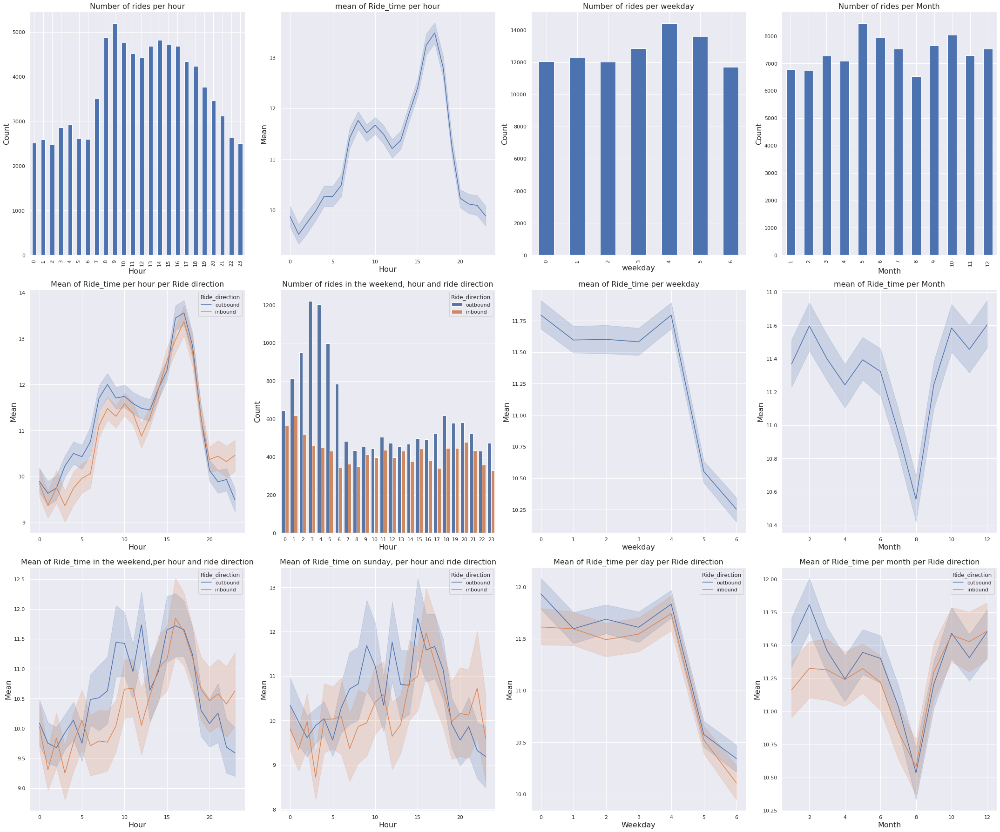

In [30]:
fig, ((ax1, ax2, ax3, ax5), (ax8, ax10, ax4, ax6), (ax11, ax12, ax7, ax9)) = plt.subplots(3, 4, figsize=(30, 25))

#lets see the number of runs per hour
df1.groupby(df1['TIMESTAMP'].dt.hour)['Ride_time'].count().plot(kind='bar', ax=ax1)
ax1.set_title('Number of rides per hour', fontsize=16)
ax1.set_xlabel('Hour', fontsize=16)
ax1.set_ylabel('Count', fontsize=16)

#lets see the mean of Ride_time per hour
sns.lineplot(x=df1['TIMESTAMP'].dt.hour, y='Ride_time', data=df1, estimator=np.mean, ax=ax2)
ax2.set_title('mean of Ride_time per hour', fontsize=16)
ax2.set_xlabel('Hour', fontsize=16)
ax2.set_ylabel('Mean', fontsize=16)

#lets see the number of runs per weekday
df1.groupby(df1['TIMESTAMP'].dt.weekday)['Ride_time'].count().plot(kind='bar', ax=ax3)
ax3.set_title('Number of rides per weekday', fontsize=16)
ax3.set_xlabel('weekday', fontsize=16)
ax3.set_ylabel('Count', fontsize=16)

#lets see the mean of Ride_time per weekday
sns.lineplot(x=df1['TIMESTAMP'].dt.weekday, y='Ride_time', data=df1, estimator=np.mean, ax=ax4)
ax4.set_title('mean of Ride_time per weekday', fontsize=16)
ax4.set_xlabel('weekday', fontsize=16)
ax4.set_ylabel('Mean', fontsize=16)

#lets see the number of runs per month
df1.groupby(df1['TIMESTAMP'].dt.month)['Ride_time'].count().plot(kind='bar', ax=ax5)
ax5.set_title('Number of rides per Month', fontsize=16)
ax5.set_xlabel('Month', fontsize=16)
ax5.set_ylabel('Count', fontsize=16)

#lets see the mean of Ride_time per month
sns.lineplot(x=df1['TIMESTAMP'].dt.month, y='Ride_time', data=df1, estimator=np.mean, ax=ax6)
ax6.set_title('mean of Ride_time per Month', fontsize=16)
ax6.set_xlabel('Month', fontsize=16)
ax6.set_ylabel('Mean', fontsize=16)

#lets see the mean of Ride_time per weekday and ride direction
sns.lineplot(x=df1['TIMESTAMP'].dt.weekday, y='Ride_time', hue='Ride_direction', data=df1, estimator=np.mean, ax=ax7)
ax7.set_title('Mean of Ride_time per day per Ride direction', fontsize=16)
ax7.set_xlabel('Weekday', fontsize=16)
ax7.set_ylabel('Mean', fontsize=16)

#lets see the mean of Ride_time per hour and ride direction
sns.lineplot(x=df1['TIMESTAMP'].dt.hour, y='Ride_time', hue='Ride_direction', data=df1, estimator=np.mean, ax=ax8)
ax8.set_title('Mean of Ride_time per hour per Ride direction', fontsize=16)
ax8.set_xlabel('Hour', fontsize=16)
ax8.set_ylabel('Mean', fontsize=16)

#lets see the mean of Ride_time per month and ride direction
sns.lineplot(x=df1['TIMESTAMP'].dt.month, y='Ride_time', hue='Ride_direction', data=df1, estimator=np.mean, ax=ax9)
ax9.set_title('Mean of Ride_time per month per Ride direction', fontsize=16)
ax9.set_xlabel('Month', fontsize=16)
ax9.set_ylabel('Mean', fontsize=16)

#lets see the number of runs per hour in the weekends
onlyweekends = df1.query('TIMESTAMP.dt.weekday >= 5')
sns.barplot(x=onlyweekends['TIMESTAMP'].dt.hour, y='Ride_time', hue='Ride_direction', data=onlyweekends, estimator=len, ax=ax10)
ax10.set_title('Number of rides in the weekend, hour and ride direction', fontsize=16)
ax10.set_xlabel('Hour', fontsize=16)
ax10.set_ylabel('Count', fontsize=16)

#lets see the average distance per hour in the weekends.
sns.lineplot(x=onlyweekends['TIMESTAMP'].dt.hour, y='Ride_time', hue='Ride_direction', data=onlyweekends, estimator=np.mean, ax=ax11)
ax11.set_title('Mean of Ride_time in the weekend,per hour and ride direction', fontsize=16)
ax11.set_xlabel('Hour', fontsize=16)
ax11.set_ylabel('Mean', fontsize=16)


#lets see the average Ride_time per hour on sunday.
onlysunday = df1.query('TIMESTAMP.dt.weekday == 6')
sns.lineplot(x=onlysunday['TIMESTAMP'].dt.hour, y='Ride_time', hue='Ride_direction', data=onlysunday, estimator=np.mean, ax=ax12)
ax12.set_title('Mean of Ride_time on sunday, per hour and ride direction', fontsize=16)
ax12.set_xlabel('Hour', fontsize=16)
ax12.set_ylabel('Mean', fontsize=16)


plt.tight_layout()

Besides a lower ride count in the morning, the average distance is higher in the mornings, whith most of the distance being made outbound. In the weekends (saturday-sunday) we have a higher volume of rides in the dawn, probably due to people going home from bars and restaurants. Most of the rides are also outbound, but the difference is lower than considering all the week.

-> Hour is relevant for distance of the ride, so it will be included in df.

The number of rides in friday and saturday are higher than the other days, and the mean distance is higher for the weekends. Mostly the rides are outbound.

-> day of the week is relevant for distance, it will be included in df.

During the summer the number of rides is higher than in january to april. The mean distance is higher during the summer, with a peak in May. May is also a peak for rides inbound. The spring and several municipal celebrations in May are probably the reason for this behaviour, specially the Santuario de Fatima celebration.

-> month is also relevant for distance, it will be included in df.

Besides not relevant for the project's objective, it is interesting to note that with timestamp and ride time information we could easily verify the times with higher traffic intensity.

We can also see that october is the less intense traffic month, but has the same average ride distance than other months.

Weekends tend to be much better in traffic than weekdays, as one could expect.

We could also correlate the ride time distribution in the map, getting the information of dropon or dropoof in the map, and the ride time as a range color.

Although interesting and esiest to visualize, this information specifically is not important for this project's purpose, since we already have the information about timestamp and dropon/dropoff, i.e., how many rides to that point per hour, so traffic intensity based in ride_time would be just a redundant information.

In [31]:
df1['Hour'] = df1['TIMESTAMP'].dt.hour
df1['Weekday'] = df1['TIMESTAMP'].dt.weekday
df1['Month'] = df1['TIMESTAMP'].dt.month

Lets see the density map of rides by hour

In [32]:
fig = px.scatter_mapbox(df1, lat='lat_1st', lon='lon_1st', zoom=11,height=600,width=1200, opacity=0.5, color='Hour', title='DROPON by Hour')
fig.update_layout(mapbox_style='open-street-map')

fig2 = px.scatter_mapbox(df1, lat='lat_last', lon='lon_last', zoom=11,height=600,width=1200, opacity=0.5, color='Hour', title='DROPOFF by Hour')
fig2.update_layout(mapbox_style='open-street-map')
fig.show()
fig2.show()

We can see that most of the rides at night are to the center of the city.

## ORIGIN and CALL_TYPE EDA

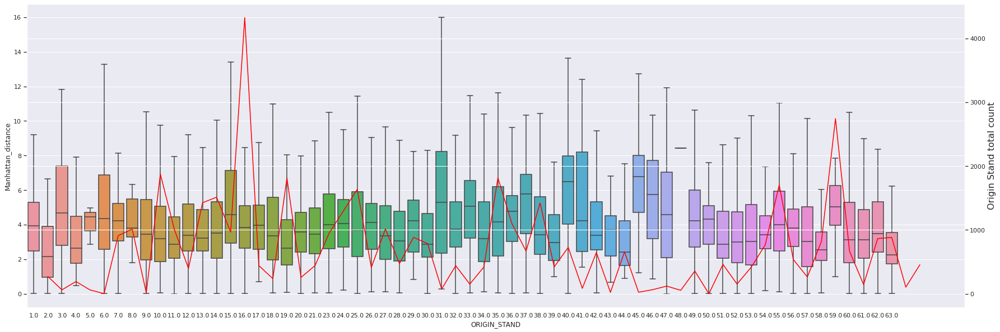

In [33]:
#check if some stands correlate with higher travels (further away)
origin = df1.dropna(subset=['ORIGIN_STAND']).reset_index() #droping NaN values, since not all the rides originate from a stand.

fig, ax  = plt.subplots(1, figsize=(30, 10))
sns.boxplot(x='ORIGIN_STAND', y='Manhattan_distance', data=origin, showfliers=False, ax=ax)
ax1.set_title('Manhattan distance distribution accordingly to Origin stand', fontsize=16)
ax1.set_xlabel('Origin Stand', fontsize=16)
ax1.set_ylabel('Manhattan distance', fontsize=16)

#lets add a line plot for the total count of rides in each stand
ax2=ax.twinx()
origin.groupby(origin['ORIGIN_STAND'])['ORIGIN_STAND'].count().plot(kind='line', color='red', ax=ax2)
ax2.set_ylabel('Origin Stand total count', fontsize=16)

plt.show()

Text(0, 0.5, 'Count')

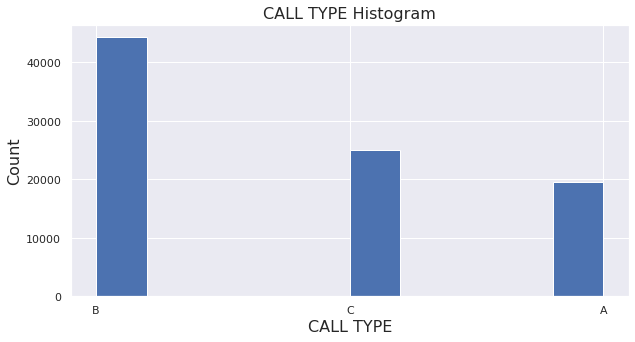

In [34]:
#the column ORIGIN TYPE only holds information for CALL_TYPE = B
#For CALL_TYPE = A we have information of ORIGIN CALL (phone number of the client)
fig, (ax1) = plt.subplots(1, figsize=(10, 5))
df1['CALL_TYPE'].hist(ax=ax1)
ax1.set_title('CALL TYPE Histogram', fontsize=16)
ax1.set_xlabel('CALL TYPE', fontsize=16)
ax1.set_ylabel('Count', fontsize=16)


Since we have a high volume of A call types, lets see where in the map the clients were picked up.

In [35]:
call_a = df1.query("CALL_TYPE == 'A'").reset_index()
call_b = df1.query("CALL_TYPE == 'B'").reset_index()
call_c = df1.query("CALL_TYPE == 'C'").reset_index()


fig1 = px.scatter_mapbox(call_a, lat='lat_1st', lon='lon_1st', zoom=11,height=600,width=1200, opacity=0.5, color_discrete_sequence=['blue'], title='DROPON for CALL TYPE = A')
fig1.update_layout(mapbox_style='open-street-map')

fig2 = px.scatter_mapbox(call_b, lat='lat_1st', lon='lon_1st', zoom=11,height=600,width=1200, opacity=0.5, color_discrete_sequence=['blue'], title='DROPON for CALL TYPE = B')
fig2.update_layout(mapbox_style='open-street-map')

fig3 = px.scatter_mapbox(call_c, lat='lat_1st', lon='lon_1st', zoom=11,height=600,width=1200, opacity=0.5, color_discrete_sequence=['blue'], title='DROPON for CALL TYPE = C')
fig3.update_layout(mapbox_style='open-street-map')

fig1.show()
fig2.show()
fig3.show()

The Call type A is always close to the stands (given by Call type B high density points). In other hand, call type C is more sparse in the city.

Now lets see the dropoff

In [36]:
call_a = df1.query("CALL_TYPE == 'A'").reset_index()
call_b = df1.query("CALL_TYPE == 'B'").reset_index()
call_c = df1.query("CALL_TYPE == 'C'").reset_index()

fig1 = px.scatter_mapbox(call_a, lat='lat_last', lon='lon_last', zoom=11,height=600,width=1200, opacity=0.5, color_discrete_sequence=['blue'], title='DROPOFF for CALL TYPE = A')
fig1.update_layout(mapbox_style='open-street-map')

fig2 = px.scatter_mapbox(call_b, lat='lat_last', lon='lon_last', zoom=11,height=600,width=1200, opacity=0.5, color_discrete_sequence=['blue'], title='DROPOFF for CALL TYPE = B')
fig2.update_layout(mapbox_style='open-street-map')

fig3 = px.scatter_mapbox(call_c, lat='lat_last', lon='lon_last', zoom=11,height=600,width=1200, opacity=0.5, color_discrete_sequence=['blue'], title='DROPOFF for CALL TYPE = C')
fig3.update_layout(mapbox_style='open-street-map')

fig1.show()
fig2.show()
fig3.show()


The dropoff is more caotic than drop on. 

For droon, the CENTRAL probably send the drivers closer to the client position, as we can supose by the higher density of points near the stands. So, for the central would be even better to know the 'nesting' position of the driver after a ride.

For that, a good idea would be attribute the closest stand from the dropon and dropoff.

Obs.: if a proof is needed, we could look for a single driver position in his ride before each Central call. If the driver is always near the closest stand from the central's client, it proves that the central calls to drivers based on stand positions.

In [37]:
import zipfile
zipfile = zipfile.ZipFile('/content/gdrive/MyDrive/Data analysis - study/Taxi Trajectory Prediction Competition/metaData_taxistandsID_name_GPSlocation.csv.zip')
location = pd.read_csv(zipfile.open('metaData_taxistandsID_name_GPSlocation.csv'))
location['Latitude'] = location['Latitude'].apply(lambda Latitude:pd.to_numeric(Latitude, errors='coerce'))

df1['Closest_Stand_dropoff'] = empty #eu add isso aqui porque lá embaixo dava erro se não tiver a coluna criada antes de rodar os for... essa coluna é o stand mais próximo do dropoff real. vai ser meu Y futuramente.
for index, row in tqdm(df1.iterrows()): #esse for é para pegar cada linha do df
  lat_last = row['lat_last']
  lon_last = row['lon_last']
  Menor = (abs(lat_last-location.at[location.index[0],'Latitude']) + abs(lon_last-location.at[location.index[0],'Longitude']))*111
  IdxMenor = 0
  for i in range(1, 62): #esse for, dentro do outro for, é para rodar a conta para cada linha (i) do df location.. o 62 é pq são 62 Ids
    ValorAtual = (abs(lat_last-location.at[location.index[i],'Latitude']) + abs(lon_last-location.at[location.index[i],'Longitude']))*111
    if ValorAtual <= Menor:
      Menor = ValorAtual
      IdxMenor = location['Descricao'][i]
  df1['Closest_Stand_dropoff'][index] = IdxMenor #esse está dentro do primeiro for, pq quero colocar o idxMenor para cada linha (cada index)


df1['Closest_Stand_dropon'] = empty
for index, row in tqdm(df1.iterrows()): #esse for é para pegar cada linha do df
  lat_1st = row['lat_1st']
  lon_1st = row['lon_1st']
  Menor = (abs(lat_1st-location.at[location.index[0],'Latitude']) + abs(lon_1st-location.at[location.index[0],'Longitude']))*111
  IdxMenor = 0
  for i in range(1, 62):
    ValorAtual = (abs(lat_1st-location.at[location.index[i],'Latitude']) + abs(lon_1st-location.at[location.index[i],'Longitude']))*111
    if ValorAtual <= Menor:
      Menor = ValorAtual
      IdxMenor = location['Descricao'][i]
  df1['Closest_Stand_dropon'][index] = IdxMenor

df1.info()



0it [00:00, ?it/s]<ipython-input-37-d7c12c20980b>:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

88847it [02:48, 526.77it/s]
0it [00:00, ?it/s]<ipython-input-37-d7c12c20980b>:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

88847it [02:39, 556.36it/s]


<class 'pandas.core.frame.DataFrame'>
Int64Index: 88847 entries, 0 to 88846
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   TRIP_ID                88847 non-null  int64         
 1   CALL_TYPE              88847 non-null  object        
 2   ORIGIN_CALL            19616 non-null  float64       
 3   ORIGIN_STAND           43652 non-null  float64       
 4   TAXI_ID                88847 non-null  int64         
 5   TIMESTAMP              88847 non-null  datetime64[ns]
 6   DAY_TYPE               88847 non-null  object        
 7   MISSING_DATA           88847 non-null  bool          
 8   POLYLINE               88847 non-null  object        
 9   lon_1st                88847 non-null  float64       
 10  lat_1st                88847 non-null  float64       
 11  lon_last               88847 non-null  float64       
 12  lat_last               88847 non-null  float64       
 13  R

Check if there is a correlation between TAXI_ID and Dropon

In [38]:
contingency_table = pd.crosstab(df1['TAXI_ID'], df1['Closest_Stand_dropon'])

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square test statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")

Chi-square test statistic: 351861.84465310245
P-value: 0.0
Degrees of freedom: 26280


Check if there is a correlation between TAXI_ID and DROPOFF

In [39]:
contingency_table = pd.crosstab(df1['TAXI_ID'], df1['Closest_Stand_dropoff'])

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square test statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")

Chi-square test statistic: 40469.07778200303
P-value: 0.0
Degrees of freedom: 26280


Check if there is a correlation between ORIGIN_CALL and dropon

In [40]:
contingency_table = pd.crosstab(df1['ORIGIN_CALL'], df1['Closest_Stand_dropon'])

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square test statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")

Chi-square test statistic: 838549.0292202143
P-value: 0.0
Degrees of freedom: 576900


Check if there is a correlation between Origin call and dropoff

In [41]:
contingency_table = pd.crosstab(df1['ORIGIN_CALL'], df1['Closest_Stand_dropoff'])

chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square test statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")

Chi-square test statistic: 671856.8643163077
P-value: 0.0
Degrees of freedom: 576900


#Closest stand dropoff prediction (Categorical)

##Adjusting the data

In [42]:
df2 = df1.copy()
df1 = df1.drop(['TRIP_ID'], axis = 'columns')
df1 = df1.drop(['ORIGIN_STAND'], axis = 'columns') #we have the names in other column now
df1 = df1.drop(['TIMESTAMP'], axis = 'columns')
df1 = df1.drop(['Ride_time'], axis = 'columns')
df1 = df1.drop(['MISSING_DATA'], axis = 'columns')
df1 = df1.drop(['POLYLINE'], axis = 'columns')
df1 = df1.drop(['lon_last'], axis = 'columns') # I will predict using the closest stand, instead of the coordinates. I could use regression models to predict it directly, but I think that would be better this way.
df1 = df1.drop(['lat_last'], axis = 'columns')
df1 = df1.drop(['DAY_TYPE'], axis = 'columns') #dropping because it is only A type.

df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88847 entries, 0 to 88846
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   CALL_TYPE              88847 non-null  object 
 1   ORIGIN_CALL            19616 non-null  float64
 2   TAXI_ID                88847 non-null  int64  
 3   lon_1st                88847 non-null  float64
 4   lat_1st                88847 non-null  float64
 5   Ride_direction         88847 non-null  object 
 6   dropon_dist            88847 non-null  object 
 7   Manhattan_distance     88847 non-null  float64
 8   Hour                   88847 non-null  int64  
 9   Weekday                88847 non-null  int64  
 10  Month                  88847 non-null  int64  
 11  Closest_Stand_dropoff  88847 non-null  object 
 12  Closest_Stand_dropon   88847 non-null  object 
dtypes: float64(4), int64(4), object(5)
memory usage: 11.5+ MB


Improving the data types

In [43]:
df1['CALL_TYPE'] = df1['CALL_TYPE'].astype(str)
df1['ORIGIN_CALL'] = df1['ORIGIN_CALL'].astype(str)
df1['TAXI_ID'] = df1['TAXI_ID'].astype(str)
df1['Ride_direction'] = df1['Ride_direction'].astype(str)
df1['Hour'] = df1['Hour'].astype(str)
df1['Weekday'] = df1['Weekday'].astype(str)
df1['Month'] = df1['Month'].astype(str)
df1['Closest_Stand_dropoff'] = df1['Closest_Stand_dropoff'].astype(str)
df1['Closest_Stand_dropon'] = df1['Closest_Stand_dropon'].astype(str)
df1['dropon_dist'] = df1['dropon_dist'].astype(str)

df1.info()
print('\n')
print(df1.nunique())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88847 entries, 0 to 88846
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   CALL_TYPE              88847 non-null  object 
 1   ORIGIN_CALL            88847 non-null  object 
 2   TAXI_ID                88847 non-null  object 
 3   lon_1st                88847 non-null  float64
 4   lat_1st                88847 non-null  float64
 5   Ride_direction         88847 non-null  object 
 6   dropon_dist            88847 non-null  object 
 7   Manhattan_distance     88847 non-null  float64
 8   Hour                   88847 non-null  object 
 9   Weekday                88847 non-null  object 
 10  Month                  88847 non-null  object 
 11  Closest_Stand_dropoff  88847 non-null  object 
 12  Closest_Stand_dropon   88847 non-null  object 
dtypes: float64(3), object(10)
memory usage: 11.5+ MB


CALL_TYPE                    3
ORIGIN_CALL             

##One-hot-encoding

For most of the models, first we need to encode the categorical data in binary features. We can perform one-hot-encoding using pandas get_dummies 

In [44]:
df1_dummies_CALL_TYPE = pd.get_dummies(df1['CALL_TYPE'], prefix='Is_CALL_TYPE')
#df1_dummies_ORIGIN_CALL = pd.get_dummies(df1['ORIGIN_CALL'], prefix='Is') #this column represents 9.6k new columns. Run without it first to avoid crash.
#df1_dummies_TAXI_ID = pd.get_dummies(df1['TAXI_ID'], prefix='Is_TAXI_ID')
df1_dummies_Ride_direction = pd.get_dummies(df1['Ride_direction'], prefix='Is_direction')
df1_dummies_dropon_dist = pd.get_dummies(df1['dropon_dist'], prefix='Is_dropon_dist')
df1_dummies_Hour = pd.get_dummies(df1['Hour'], prefix='Is_hour')
df1_dummies_Weekday = pd.get_dummies(df1['Weekday'], prefix='Is_weekday')
df1_dummies_Month = pd.get_dummies(df1['Month'], prefix='Is_month')
df1_dummies_Closest_Stand_dropon = pd.get_dummies(df1['Closest_Stand_dropon'], prefix='Is_dropon')
df1 = pd.concat([df1, df1_dummies_CALL_TYPE, df1_dummies_Ride_direction, df1_dummies_dropon_dist, df1_dummies_Hour, df1_dummies_Weekday, df1_dummies_Month, df1_dummies_Closest_Stand_dropon], axis=1)
df1 = df1.drop(['CALL_TYPE', 'ORIGIN_CALL', 'dropon_dist', 'TAXI_ID', 'Ride_direction', 'Hour', 'Weekday', 'Month', 'Closest_Stand_dropon' ], axis='columns')
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88847 entries, 0 to 88846
Columns: 117 entries, lon_1st to Is_dropon_Viso
dtypes: float64(3), object(1), uint8(113)
memory usage: 15.0+ MB


##Data split

In [45]:
le = LabelEncoder()
sample_size = 10000
sampled_df = df1.sample(n=sample_size, random_state=42).reset_index()

x = sampled_df.drop(['Closest_Stand_dropoff'], axis = 1)
y = le.fit_transform(sampled_df['Closest_Stand_dropoff'])

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=44)

## Naive model

As we have categorical data, First lets use a naive_model to create a baseline for the future models. As a categorical data, a good naive model would be using the mode.

In [46]:
df_y_test= pd.DataFrame(y_test, columns=['y_test'])
train_mode = statistics.mode(df_y_test['y_test'])
prediction = df_y_test['y_test'].value_counts()

print("Accuracy = ", (prediction[train_mode]*100)/len(y_test), "%")

Accuracy =  5.1 %


This is going to be our baseline.

Another possible Naive model would be a DummyClassifier, but to run this model the data must be already encoded.

In [47]:
clf_dummy = DummyClassifier(random_state=42) 

clf_dummy.fit(X_train, y_train)
y_pred = clf_dummy.predict(X_test)
print("Accuracy = ", metrics.accuracy_score(y_test, y_pred)*100, '%')

Accuracy =  5.1 %


As seen, the accuracy was identical to the mode, calculated before.

##Random Forest (Classifier)

In [48]:
rf_model = RandomForestClassifier(n_estimators=1000, random_state=42)
rf_model.fit(X_train, y_train)
RF_predictions = rf_model.predict(X_test)
print("Accuracy = ", metrics.accuracy_score(y_test, RF_predictions)*100)

Accuracy =  18.333333333333332


##LightGBM classifier

In [49]:
LGBM_model = ltb.LGBMClassifier()
LGBM_model.fit(X_train, y_train)
LGBM_predictions = LGBM_model.predict(X_test)
print("Accuracy = ", metrics.accuracy_score(y_test, LGBM_predictions)*100, '%')

Accuracy =  21.866666666666667 %


##CATBOOST Classifier

In [50]:
clf = CatBoostClassifier(iterations=800, random_seed= 42, learning_rate=0.1, verbose=False, depth=6, early_stopping_rounds=10)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print("Accuracy = ", metrics.accuracy_score(y_test, y_pred)*100, '%')

Accuracy =  20.733333333333334 %


#Dropoff Lat and Lon prediction (continuous variables)

##Adjust the data

In [51]:
#use the df2, created before the one hot encoding.

#drop uneded columns
df2 = df2.drop(['TRIP_ID'], axis = 'columns')
df2 = df2.drop(['ORIGIN_CALL'], axis = 'columns')
df2 = df2.drop(['TAXI_ID'], axis = 'columns')
df2 = df2.drop(['ORIGIN_STAND'], axis = 'columns') #we have the names in other column now
df2 = df2.drop(['TIMESTAMP'], axis = 'columns')
df2 = df2.drop(['Ride_time'], axis = 'columns')
df2 = df2.drop(['MISSING_DATA'], axis = 'columns')
df2 = df2.drop(['POLYLINE'], axis = 'columns')
df2 = df2.drop(['DAY_TYPE'], axis = 'columns') #dropping because it is only A type.
df2 = df2.drop(['Closest_Stand_dropoff'], axis = 'columns')

#improve types
df2['CALL_TYPE'] = df2['CALL_TYPE'].astype(str)
df2['Ride_direction'] = df2['Ride_direction'].astype(str)
df2['dropon_dist'] = df2['dropon_dist'].astype(str)
df2['Hour'] = df2['Hour'].astype(str)
df2['Weekday'] = df2['Weekday'].astype(str)
df2['Month'] = df2['Month'].astype(str)
df2['Closest_Stand_dropon'] = df2['Closest_Stand_dropon'].astype(str)

#get data encoded
df2_dummies_CALL_TYPE = pd.get_dummies(df2['CALL_TYPE'], prefix='Is_CALL_TYPE')
df2_dummies_Ride_direction = pd.get_dummies(df2['Ride_direction'], prefix='Is_Ride_direction')
df2_dummies_dropon_dist = pd.get_dummies(df2['dropon_dist'], prefix='Is_dropon_dist')
df2_dummies_Hour = pd.get_dummies(df2['Hour'], prefix='Is_Hour')
df2_dummies_Weekday = pd.get_dummies(df2['Weekday'], prefix='Is_Weekday')
df2_dummies_Month = pd.get_dummies(df2['Month'], prefix='Is_Month')
df2_dummies_Closest_Stand_dropon = pd.get_dummies(df2['Closest_Stand_dropon'], prefix='Is_Closest_Stand_dropon')
df2 = pd.concat([df2, df2_dummies_CALL_TYPE, df2_dummies_dropon_dist, df2_dummies_Ride_direction, df2_dummies_Hour, df2_dummies_Weekday, df2_dummies_Month, df2_dummies_Closest_Stand_dropon], axis=1)

df2 = df2.drop(['CALL_TYPE', 'Ride_direction', 'dropon_dist', 'Hour', 'Weekday', 'Month', 'Closest_Stand_dropon'], axis = 'columns')
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88847 entries, 0 to 88846
Columns: 118 entries, lon_1st to Is_Closest_Stand_dropon_Viso
dtypes: float64(5), uint8(113)
memory usage: 15.7 MB


##Data Split for regression

In [58]:
sample_size = 88000 #for avoiding RAM issues
sampled_df = df2.sample(n=sample_size, random_state=42).reset_index()

x = sampled_df.drop(['lon_last', 'lat_last'], axis = 1)
y = sampled_df[['lon_last', 'lat_last']]

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=44)

##Naive Model (Dummy_Regressor)

In [53]:
dummy_regr = DummyRegressor(strategy='mean')
dummy_regr.fit(X_train, y_train)

dummy_pred = dummy_regr.predict(X_test)
MSE = mean_squared_error(y_test, dummy_pred)
MRSE = np.sqrt(MSE.mean())

#calculate the distance between predicted and real dropoff
dummy_predicted = pd.DataFrame(dummy_pred)
dummy_predicted = dummy_predicted.rename(columns={dummy_predicted.columns[1]: 'pred_lat'})
dummy_predicted = dummy_predicted.rename(columns={dummy_predicted.columns[0]: 'pred_lon'})
y_test1 = y_test.reset_index()
dummy_predicted = pd.concat([dummy_predicted, y_test1], axis=1)
dummy_predicted['mht_distance'] = (abs(dummy_predicted['pred_lat'] - dummy_predicted['lat_last']) + abs(dummy_predicted['pred_lon'] - dummy_predicted['lon_last']))*111
average = dummy_predicted['mht_distance'].mean()
std = dummy_predicted['mht_distance'].std()

print("MSE = ", MSE)
print("RMSE = ", MRSE)
print('Average distance between predicted vs. real dropoff = ', average, ' +/- ', std, ' km')

MSE =  0.0006130597525865783
MRSE =  0.02476004346899614
Average distance between predicted vs. real dropoff =  4.080779414247098  +/-  2.7645931825370758  km


##Linear Regression

In [54]:
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)

linear_pred = model_lr.predict(X_test)
MSE = mean_squared_error(y_test, linear_pred)
MRSE = np.sqrt(MSE.mean())

#calculate the distance between predicted and real dropoff
linear_predicted = pd.DataFrame(linear_pred)
linear_predicted = linear_predicted.rename(columns={linear_predicted.columns[1]: 'pred_lat'})
linear_predicted = linear_predicted.rename(columns={linear_predicted.columns[0]: 'pred_lon'})
y_test1 = y_test.reset_index()
linear_predicted = pd.concat([linear_predicted, y_test1], axis=1)
linear_predicted['mht_distance'] = (abs(linear_predicted['pred_lat'] - linear_predicted['lat_last']) + abs(linear_predicted['pred_lon'] - linear_predicted['lon_last']))*111
average = linear_predicted['mht_distance'].mean()
std = linear_predicted['mht_distance'].std()

print("MSE = ", MSE)
print("RMSE = ", MRSE)
print('Average distance between predicted vs. real dropoff = ', average, ' +/- ', std, ' km')

MSE =  0.00041115350371210044
MRSE =  0.0202769204691467
Average distance between predicted vs. real dropoff =  3.2982853096038918  +/-  2.190348828215774  km


##Random Forest Regressor

In [55]:
model_rf = RandomForestRegressor(n_estimators=100, max_depth=6, random_state=42)
model_rf.fit(X_train, y_train)

rf_prediction = model_rf.predict(X_test)
MSE = mean_squared_error(y_test, rf_prediction)
MRSE = np.sqrt(MSE.mean())

#calculate the distance between predicted and real dropoff
rf_predicted = pd.DataFrame(rf_prediction)
rf_predicted = rf_predicted.rename(columns={rf_predicted.columns[1]: 'pred_lat'})
rf_predicted = rf_predicted.rename(columns={rf_predicted.columns[0]: 'pred_lon'})
y_test1 = y_test.reset_index()
rf_predicted = pd.concat([rf_predicted, y_test1], axis=1)
rf_predicted['mht_distance'] = (abs(rf_predicted['pred_lat'] - rf_predicted['lat_last']) + abs(rf_predicted['pred_lon'] - rf_predicted['lon_last']))*111
average = rf_predicted['mht_distance'].mean()
std = rf_predicted['mht_distance'].std()

print("MSE = ", MSE)
print("RMSE = ", MRSE)
print('Average distance between predicted vs. real dropoff = ', average, ' +/- ', std, ' km')

MSE =  0.0002900759167091881
MRSE =  0.01703161521139989
Average distance between predicted vs. real dropoff =  2.6160018438182173  +/-  1.9927118255585605  km


##LightGBM regression

In [59]:
params = {'objective': 'regression', 'metric': 'mse', 'num_leaves': 20, 'learning_rate': 0.1}
model_ltb_lat = ltb.LGBMRegressor(**params)
model_ltb_lon = ltb.LGBMRegressor(**params)

model_ltb_lat.fit(X_train, y_train['lat_last'], eval_set=[(X_test, y_test['lat_last'])], early_stopping_rounds=20, verbose=False)
model_ltb_lon.fit(X_train, y_train['lon_last'], eval_set=[(X_test, y_test['lon_last'])], early_stopping_rounds=20, verbose=False)

ltb_prediction_lat = model_ltb_lat.predict(X_test)
ltb_prediction_lon = model_ltb_lon.predict(X_test)
MSE_lat = mean_squared_error(y_test['lat_last'], ltb_prediction_lat)
MSE_lon = mean_squared_error(y_test['lon_last'], ltb_prediction_lon)
MRSE_lat = np.sqrt(MSE_lat.mean())
MRSE_lon = np.sqrt(MSE_lon.mean())

#calculate the distance between predicted and real dropoff
ltb_predicted_lat = pd.DataFrame(ltb_prediction_lat)
ltb_predicted_lon = pd.DataFrame(ltb_prediction_lon)

ltb_predicted_lat = ltb_predicted_lat.rename(columns={ltb_predicted_lat.columns[0]: 'pred_lat'})
ltb_predicted_lon = ltb_predicted_lon.rename(columns={ltb_predicted_lon.columns[0]: 'pred_lon'})
y_test1 = y_test.reset_index()
ltb_predicted = pd.concat([ltb_predicted_lat, ltb_predicted_lon, y_test1], axis=1)
ltb_predicted['mht_distance'] = (abs(ltb_predicted['pred_lat'] - ltb_predicted['lat_last']) + abs(ltb_predicted['pred_lon'] - ltb_predicted['lon_last']))*111
average = ltb_predicted['mht_distance'].mean()
std = ltb_predicted['mht_distance'].std()

print("MSE_lat = ", MSE_lat)
print("MSE_lat = ", MSE_lon)
print("RMSE_lat = ", MRSE_lat)
print("RMSE_lon = ", MRSE_lon)
print('Average distance between predicted vs. real dropoff = ', average, ' +/- ', std, ' km')

MSE_lat =  9.216957159785049e-05
MSE_lat =  0.0004265535917527236
RMSE_lat =  0.00960049850777815
RMSE_lon =  0.020653173890536138
Average distance between predicted vs. real dropoff =  2.369551636513218  +/-  1.988776984736789  km


#CONCLUSION

Between the two modeling aproaches, the regression models were more precise than the classifiers. 
Between the used regression models, LightGBM was the more accurate, with the lower average distance from the predicted dropoff to the real dropoff. However, the average distance is still high (2.3 km).

We could make the models more precise using partial coordenates, but assuming that the model should predict the dropoff using only informations given by the dropon, the given average distance is much better than the naive model.